# Transferring the three MSI modalities onto finer Visium HD resolutions

Picks up after `examples/three_msi_modalities_visium_hd.ipynb`: reuses the registrations that
notebook already computed (saved via `registration_result.save(...)`) to transfer all three MSI
modalities onto three additional targets from the *same* Space Ranger run --
**16 µm bins**, **8 µm bins**, and Space Ranger's own **cell segmentation** -- with no new
landmark picking or elastic registration. Registration only depends on the two H&E images
(already done once); only *which points* get matched against it changes here.

(2 µm bins are deliberately left out here: native MSI acquisition pitch for all three
modalities is ~8.4-8.5 µm, well above the 2 µm bin size, so nearest-neighbor transfer onto a
2 µm grid just repeats each MSI value across a dense patch of neighboring bins -- correct, but
not an informative comparison. 16 µm and 8 µm both sit closer to the MSI instrument's own
resolution and make for a more meaningful comparison against cell segmentation.)

Two things this notebook reuses from the earlier one instead of recomputing:

- Each modality's own-H&E alignment (`sw.align_grid`'s output), reloaded from the
  `transformed_coordinates_DD1974_<name>.csv` files that notebook's Step 3 saved, paired with a
  fresh (fast, non-interactive) reload of that modality's raw feature values.
- Each modality's H&E-to-Visium-HD registration, reloaded via `sw.RegistrationResult.load(...)`
  from the `.tfm` files that notebook's Step 4 saved.

**Cell segmentation is structurally different from the two bin resolutions**: Space Ranger
gives per-cell polygon outlines (`segmented_outputs/cell_segmentations.geojson`), not point
positions on a regular grid, so a cell's "position" here is its polygon centroid, and cells
don't have `array_row`/`array_col` to pivot into a grid image for plotting -- that target gets
a plain scatter plot instead of the `imshow`-grid style used for the two bin resolutions.

In [1]:
import os
import sys
sys.path.insert(0, "msi")  # examples/msi/ contains msi_loader.py (MSI vendor CSV parsing)

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch
import scanpy as sc
import anndata as ad

import spatialdata as sd
from spatialdata import SpatialData
from spatialdata.models import Image2DModel
import spatialdata_io
import spatialwarp as sw

from msi_loader import MSIdata

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:504: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve the old behavior
  left = partial(_left_join_spatialelement_table)
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:505: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve the old behavior
  left_exclusive = partial(_left_exclusive_join_

## Step 1 -- Visium HD base: hires image + scale factor

Same as `three_msi_modalities_visium_hd.ipynb`'s Step 1. `hires_scale` is a property of the
underlying image/fullres-pixel relationship, not of any particular bin size, so it's computed
once here and reused for every target below (bins and cells alike).

In [2]:
visium_outs = "/home/croizer/Documents/04_Collaborations/03_Genial/SpatialWarp/DD1974/outs"
visium_fullres_tif = "/home/croizer/Documents/04_Collaborations/03_Genial/SpatialWarp/DD1974/DD1974.tif"

feature_slice_link = os.path.join(visium_outs, "DD1974_feature_slice.h5")
if not os.path.exists(feature_slice_link):
    os.symlink("feature_slice.h5", feature_slice_link)

visium_raw_sdata = spatialdata_io.visium_hd(
    visium_outs, dataset_id="DD1974", bin_size=16, fullres_image_file=visium_fullres_tif,
)
hires_scale = sd.transformations.get_transformation(
    visium_raw_sdata.shapes["DD1974_square_016um"], "downscaled_hires"
).scale[0]
visium_he_array = sw.extract_image(visium_raw_sdata, key="DD1974_hires_image")
print("hires_scale:", hires_scale, " visium_he_array:", visium_he_array.shape)

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


hires_scale: 0.104076326  visium_he_array: (3149, 6000, 3)


## Step 2 -- Reload each modality's alignment and registration

`msi_points[name]` holds each modality's raw MSI coordinates/features (needed again below,
since each new target still needs its own nearest-neighbor match); `msi_sdata[name]` is that
modality's grid already aligned onto its own H&E, rebuilt directly from the saved CSV instead of
re-running `sw.align_grid`'s landmark picking; `registration_results[name]` is the saved
H&E-to-Visium-HD transform.

In [3]:
alix_base = "/home/croizer/Downloads/transfer_544950_files_937b8558"

modalities = {
    "metabo": {
        "intensity": f"{alix_base}/Results-Metabolomics/Statistic files/1974/Regions-Root Mean Square.csv",
        "annotation": f"{alix_base}/Results-Metabolomics/Library/Metabolomics.csv",
        "region": f"{alix_base}/Results-Metabolomics/Statistic files/1974/20260205_Brosch_Metab1974.csv",
    },
    "lipidneg": {
        "intensity": f"{alix_base}/Results-Lipidomics Negative/Statistic files/1974/Regions-Total Ion Count.csv",
        "annotation": f"{alix_base}/Results-Lipidomics Negative/Library/Lipidomics Negative.csv",
        "region": f"{alix_base}/Results-Lipidomics Negative/Statistic files/1974/20260206_Brosch_Lip_Neg_1974.csv",
    },
    "lipidpos": {
        "intensity": f"{alix_base}/Results-Lipidomics-Positive/Statistic files/1974/Regions-Total Ion Count.csv",
        "annotation": f"{alix_base}/Results-Lipidomics-Positive/Library/Lipidmics positive.csv",
        "region": f"{alix_base}/Results-Lipidomics-Positive/Statistic files/1974/20260209_Brosch_Lip_Pos1974.csv",
    },
}

msi_sdata = {}
registration_results = {}

for name, cfg in modalities.items():
    msi = MSIdata(cfg["intensity"], cfg["annotation"], cfg["region"])
    features = msi.get_count_formated().drop(columns=["x", "y"])

    aligned = pd.read_csv(f"transformed_coordinates_DD1974_{name}.csv")
    aligned_xy = aligned[["x_transformed", "y_transformed"]].values

    msi_sdata[name] = sw.build_spatialdata(
        visium_he_array, aligned_xy, values=features, image_key="he", table_key="msi"
    )

    # fixed_size must match visium_he_array's own (width, height) -- same image the original
    # registration was computed against
    fixed_size = (visium_he_array.shape[1], visium_he_array.shape[0])
    registration_results[name] = sw.RegistrationResult.load(f"registration_{name}_DD1974", fixed_size=fixed_size)

    print(f"{name}: {aligned_xy.shape[0]} MSI points reloaded, registration loaded")

INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
metabo: 118795 MSI points reloaded, registration loaded
INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
lipidneg: 122451 MSI points reloaded, registration loaded
INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
lipidpos: 102225 MSI points reloaded, registration loaded


## Step 3 -- Build each target as a plain image + points `SpatialData`

One small helper, reused for every target: rescale raw (full-resolution) point coordinates into
`visium_he_array`'s own pixel space (same `hires_scale` rescale used throughout this pipeline),
then wrap as a `SpatialData` object -- the same shape every `fixed` object in this pipeline has.

In [4]:
def to_target_sdata(points_xy_fullres, table, table_key):
    table = table.copy()
    table.obsm["spatial"] = points_xy_fullres * hires_scale
    return SpatialData(
        images={"he": Image2DModel.parse(np.moveaxis(np.atleast_3d(visium_he_array), -1, 0))},
        tables={table_key: table},
    )

### 16 µm and 8 µm bins

The 16 µm table is already sitting in `visium_raw_sdata` from Step 1 (that's the bin size it was
loaded at just to get `hires_scale`), so it's reused directly here instead of reloading it.
8 µm needs its own `spatialdata_io.visium_hd(...)` call at that bin size.

In [6]:
visium_raw_sdata

SpatialData object
├── Images
│     ├── 'DD1974_full_image': DataTree[cyx] (3, 30253, 57650), (3, 15126, 28825), (3, 7563, 14412), (3, 3781, 7206), (3, 1890, 3603)
│     ├── 'DD1974_hires_image': DataArray[cyx] (3, 3149, 6000)
│     └── 'DD1974_lowres_image': DataArray[cyx] (3, 315, 600)
├── Shapes
│     └── 'DD1974_square_016um': GeoDataFrame shape: (137858, 1) (2D shapes)
└── Tables
      └── 'square_016um': AnnData (137858, 18085)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        DD1974_hires_image (Images), DD1974_square_016um (Shapes)
    ▸ 'downscaled_lowres', with elements:
        DD1974_lowres_image (Images), DD1974_square_016um (Shapes)
    ▸ 'global', with elements:
        DD1974_full_image (Images), DD1974_square_016um (Shapes)

In [7]:
targets = {}

table_016 = visium_raw_sdata.tables["square_016um"]
targets["square_016um"] = to_target_sdata(table_016.obsm["spatial"], table_016, "square_016um")
print(f"square_016um: {table_016.n_obs} bins")

for bin_size in (8,):
    key = f"square_{bin_size:03d}um"
    raw_sdata = spatialdata_io.visium_hd(
        visium_outs, dataset_id="DD1974", bin_size=bin_size, fullres_image_file=visium_fullres_tif,
    )
    table = raw_sdata.tables[key]
    targets[key] = to_target_sdata(table.obsm["spatial"], table, key)
    print(f"{key}: {table.n_obs} bins")

INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'DD1974_square_016um', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


square_016um: 137858 bins


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
square_008um: 548097 bins


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'DD1974_square_008um', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


### Cell segmentation

`filtered_feature_cell_matrix.h5`'s cells are named `cellid_<9-digit cell_id>-1`, matching the
`cell_id` property in `cell_segmentations.geojson` 1:1 -- each cell's polygon centroid becomes
its `obsm['spatial']` position. The "geographic CRS" warning from `geopandas` is a false
positive (these are pixel, not lat/lon, coordinates -- `geojson`'s default CRS assumption
doesn't apply here, and doesn't affect the centroid computation).

In [8]:
cell_geojson = os.path.join(visium_outs, "segmented_outputs", "cell_segmentations.geojson")
cell_matrix_h5 = os.path.join(visium_outs, "segmented_outputs", "filtered_feature_cell_matrix.h5")

gdf = gpd.read_file(cell_geojson)
centroids = gdf.geometry.centroid
cell_xy = pd.DataFrame({"x": centroids.x.values, "y": centroids.y.values})
cell_xy.index = gdf["cell_id"].apply(lambda i: f"cellid_{i:09d}-1")

adata_cells = sc.read_10x_h5(cell_matrix_h5)
matched_xy = cell_xy.reindex(adata_cells.obs_names)
assert matched_xy["x"].notna().all(), "some cells in the matrix have no matching segmentation polygon"
adata_cells.obsm["spatial"] = matched_xy[["x", "y"]].values.astype(float)

targets["cells"] = to_target_sdata(adata_cells.obsm["spatial"], adata_cells, "cells")
print(f"cells: {adata_cells.n_obs} segmented cells")

/tmp/ipykernel_377404/2904727478.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = gdf.geometry.centroid
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
cells: 439204 segmented cells


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Step 4 -- Transfer all three modalities onto each target

For each target, each modality's saved registration is reused directly (no `already_aligned`
here -- the registration transform still needs to be *applied*, just not recomputed), and every
modality's matched features are reindexed onto the first modality's matched entities, same
pattern as `examples/three_msi_modalities_visium_hd.ipynb`'s Step 4.

In [9]:
merged_targets = {}

for target_key, target_sdata in targets.items():
    table_key = "cells" if target_key == "cells" else target_key
    merged = None
    for name in modalities:
        result = sw.align(
            moving=msi_sdata[name],
            fixed=target_sdata,
            registration_result=registration_results[name],
            distance_threshold=15.0,
            moving_table_key="msi",
            fixed_table_key=table_key,
            moving_obsm_key=name,
        )
        if merged is None:
            merged = result
        else:
            merged.obsm[name] = result.obsm[name].reindex(merged.obs_names)
    merged_targets[target_key] = merged
    print(f"{target_key}: {merged.n_obs} entities kept")

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


square_016um: 137384 entities kept


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


square_008um: 546608 entities kept


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


cells: 438468 entities kept


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Step 5 -- Cluster + plot each target

One shared routine: Leiden clustering on the RNA data (same recipe used throughout this
pipeline), a spatial plot of the clusters, and a UMAP. Bin targets use the `array_row`/
`array_col` grid + `imshow` (a real regular grid, so this renders as exact squares with no
marker-size guessing); cells have no such grid, so they get a plain scatter at their centroid
positions instead.

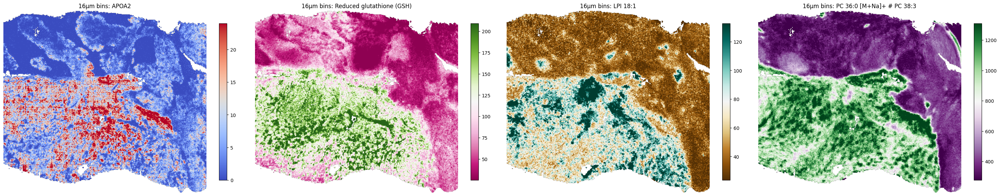

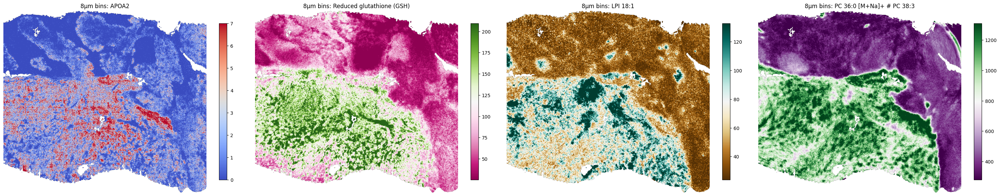

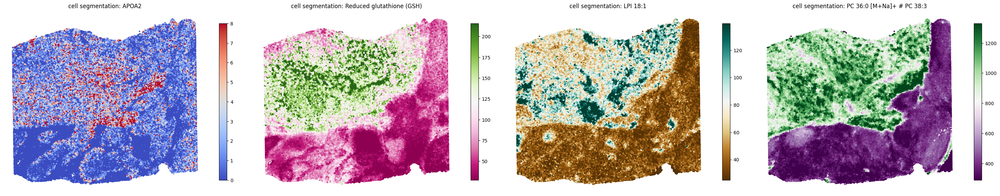

In [10]:
gene_name = "APOA2"
metabo_feature = 'Reduced glutathione (GSH)'
lipidneg_feature = "LPI 18:1"
lipidpos_feature = 'PC 36:0 [M+Na]+ # PC 38:3'

vmin_percentile = 5
vmax_percentile = 95
point_size = 4

def plot_features(merged, title, use_grid):
    panels = [
        (gene_name, merged.obs_vector(gene_name), "coolwarm"),
        (metabo_feature, merged.obsm["metabo"][metabo_feature].fillna(0).values, "PiYG"),
        (lipidneg_feature, merged.obsm["lipidneg"][lipidneg_feature].fillna(0).values, "BrBG"),
        (lipidpos_feature, merged.obsm["lipidpos"][lipidpos_feature].fillna(0).values, "PRGn"),
    ]

    fig, axes = plt.subplots(1, 4, figsize=(30, 8))
    for ax, (name, values, cmap) in zip(axes, panels):
        vmin = np.nanpercentile(values, vmin_percentile)
        vmax = np.nanpercentile(values, vmax_percentile)

        if use_grid:
            row = merged.obs["array_row"].values.astype(int)
            col = merged.obs["array_col"].values.astype(int)
            row0, col0 = row.min(), col.min()
            grid = np.full((row.max() - row0 + 1, col.max() - col0 + 1), np.nan)
            grid[row - row0, col - col0] = values
            im = ax.imshow(grid, cmap=cmap, vmin=vmin, vmax=vmax)
        else:
            coords = merged.obsm["spatial"]
            im = ax.scatter(coords[:, 0], -coords[:, 1], c=values, cmap=cmap, vmin=vmin, vmax=vmax, s=point_size)
            ax.set_aspect("equal")

        ax.axis("off")
        ax.set_title(f"{title}: {name}")
        plt.colorbar(im, ax=ax, shrink=0.6)

    plt.tight_layout()
    plt.show()

plot_features(merged_targets["square_016um"], "16µm bins", use_grid=True)
plot_features(merged_targets["square_008um"], "8µm bins", use_grid=True)
plot_features(merged_targets["cells"], "cell segmentation", use_grid=False)


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


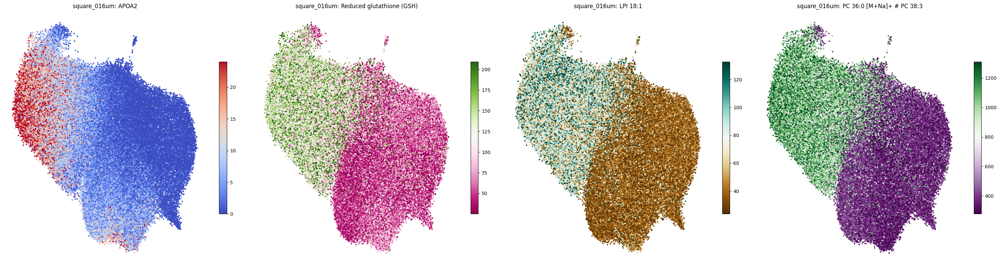

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling bac

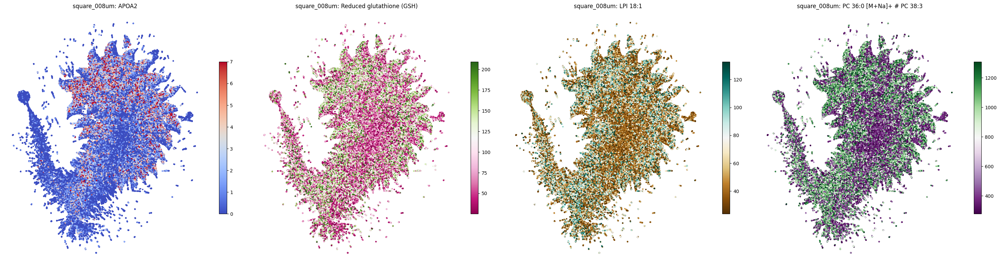

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling bac

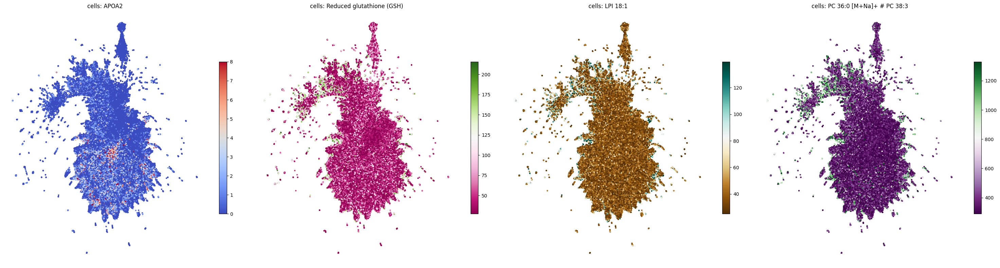

In [11]:
gene_name = "APOA2"
metabo_feature = 'Reduced glutathione (GSH)'
lipidneg_feature = "LPI 18:1"
lipidpos_feature = 'PC 36:0 [M+Na]+ # PC 38:3'

vmin_percentile = 5
vmax_percentile = 95
point_size = 4


def umap_and_plot_features(merged, title):
    adata_rna = merged.copy()
    sc.pp.normalize_total(adata_rna, target_sum=1e4)
    sc.pp.log1p(adata_rna)
    sc.pp.highly_variable_genes(adata_rna, n_top_genes=2000)
    adata_rna = adata_rna[:, adata_rna.var["highly_variable"]].copy()
    sc.pp.scale(adata_rna, max_value=10)
    sc.tl.pca(adata_rna)
    sc.pp.neighbors(adata_rna)
    sc.tl.umap(adata_rna)
    umap_coords = adata_rna.obsm["X_umap"]

    panels = [
        (gene_name, merged.obs_vector(gene_name), "coolwarm"),
        (metabo_feature, merged.obsm["metabo"][metabo_feature].fillna(0).values, "PiYG"),
        (lipidneg_feature, merged.obsm["lipidneg"][lipidneg_feature].fillna(0).values, "BrBG"),
        (lipidpos_feature, merged.obsm["lipidpos"][lipidpos_feature].fillna(0).values, "PRGn"),
    ]

    fig, axes = plt.subplots(1, 4, figsize=(30, 8))
    for ax, (name, values, cmap) in zip(axes, panels):
        vmin = np.nanpercentile(values, vmin_percentile)
        vmax = np.nanpercentile(values, vmax_percentile)
        sca = ax.scatter(umap_coords[:, 0], umap_coords[:, 1], c=values, cmap=cmap, vmin=vmin, vmax=vmax, s=point_size)
        ax.set_title(f"{title}: {name}")
        ax.axis("off")
        plt.colorbar(sca, ax=ax, shrink=0.6)

    plt.tight_layout()
    plt.show()


for target_key, merged in merged_targets.items():
    umap_and_plot_features(merged, target_key)


3809 real cell polygons in the zoomed window


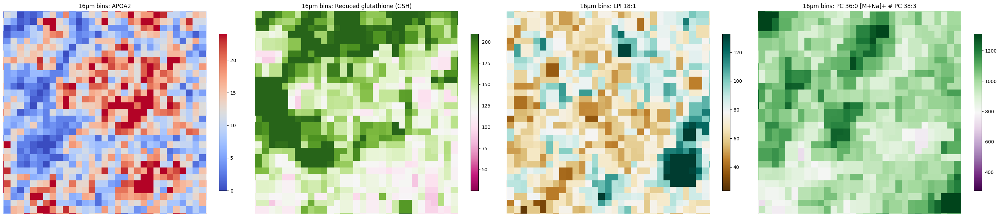

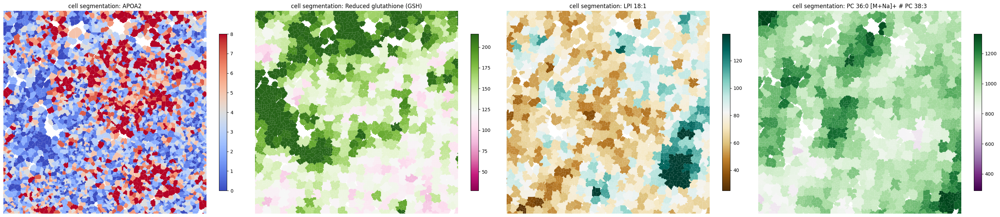

In [23]:
gene_name = "APOA2"
metabo_feature = 'Reduced glutathione (GSH)'
lipidneg_feature = "LPI 18:1"
lipidpos_feature = 'PC 36:0 [M+Na]+ # PC 38:3'

vmin_percentile = 5
vmax_percentile = 95
point_size = 4

window_um = 500
flip_cells_y = False  # toggle this if the cell polygons still look upside-down

zoom_center_x = 3000
zoom_center_y = 1000

from scipy.spatial import cKDTree
import matplotlib.cm as cm
import matplotlib.colors as mcolors

bin8_xy = merged_targets["square_008um"].obsm["spatial"]
nn_dist, _ = cKDTree(bin8_xy).query(bin8_xy, k=2)
px_per_um = np.median(nn_dist[:, 1]) / 8
half_window_px = (window_um * px_per_um) / 2

bin_pitch_um = {"square_016um": 16, "square_008um": 8}



def zoom_to_window(ax, merged, target_key, use_grid):
    if use_grid:
        row = merged.obs["array_row"].values.astype(int)
        col = merged.obs["array_col"].values.astype(int)
        coords = merged.obsm["spatial"]
        i = np.argmin((coords[:, 0] - zoom_center_x) ** 2 + (coords[:, 1] - zoom_center_y) ** 2)
        row0, col0 = row.min(), col.min()
        half_window_bins = window_um / bin_pitch_um[target_key] / 2
        ax.set_xlim(col[i] - col0 - half_window_bins, col[i] - col0 + half_window_bins)
        ax.set_ylim(row[i] - row0 + half_window_bins, row[i] - row0 - half_window_bins)
    else:
        ax.set_xlim(zoom_center_x - half_window_px, zoom_center_x + half_window_px)
        ax.set_ylim(zoom_center_y - half_window_px, zoom_center_y + half_window_px)
        if flip_cells_y:
            ax.invert_yaxis()


gdf_hires = gdf.copy()
gdf_hires["geometry"] = gdf_hires.geometry.affine_transform([hires_scale, 0, 0, hires_scale, 0, 0])
gdf_hires.index = gdf_hires["cell_id"].apply(lambda i: f"cellid_{i:09d}-1")

gdf_zoomed = gdf_hires.cx[
    zoom_center_x - half_window_px : zoom_center_x + half_window_px,
    zoom_center_y - half_window_px : zoom_center_y + half_window_px,
]
gdf_zoomed = gdf_zoomed[gdf_zoomed.index.isin(merged_targets["cells"].obs_names)]
print(f"{len(gdf_zoomed)} real cell polygons in the zoomed window")


def plot_features(merged, title, target_key, use_grid):
    panels = [
        (gene_name, merged.obs_vector(gene_name), "coolwarm"),
        (metabo_feature, merged.obsm["metabo"][metabo_feature].fillna(0).values, "PiYG"),
        (lipidneg_feature, merged.obsm["lipidneg"][lipidneg_feature].fillna(0).values, "BrBG"),
        (lipidpos_feature, merged.obsm["lipidpos"][lipidpos_feature].fillna(0).values, "PRGn"),
    ]

    fig, axes = plt.subplots(1, 4, figsize=(30, 8))
    for ax, (name, values, cmap) in zip(axes, panels):
        vmin = np.nanpercentile(values, vmin_percentile)
        vmax = np.nanpercentile(values, vmax_percentile)

        if target_key == "cells":
            value_series = pd.Series(values, index=merged.obs_names)
            plot_gdf = gdf_zoomed.copy()
            plot_gdf["value"] = value_series.reindex(plot_gdf.index).values
            plot_gdf.plot(column="value", cmap=cmap, vmin=vmin, vmax=vmax, ax=ax, edgecolor="none")
            ax.set_aspect("equal")
        elif use_grid:
            row = merged.obs["array_row"].values.astype(int)
            col = merged.obs["array_col"].values.astype(int)
            row0, col0 = row.min(), col.min()
            grid = np.full((row.max() - row0 + 1, col.max() - col0 + 1), np.nan)
            grid[row - row0, col - col0] = values
            ax.imshow(grid, cmap=cmap, vmin=vmin, vmax=vmax)
        else:
            coords = merged.obsm["spatial"]
            ax.scatter(coords[:, 0], coords[:, 1], c=values, cmap=cmap, vmin=vmin, vmax=vmax, s=point_size)
            ax.set_aspect("equal")

        zoom_to_window(ax, merged, target_key, use_grid)
        ax.axis("off")
        ax.set_title(f"{title}: {name}")
        plt.colorbar(cm.ScalarMappable(norm=mcolors.Normalize(vmin=vmin, vmax=vmax), cmap=cmap), ax=ax, shrink=0.6)

    plt.tight_layout()
    plt.show()


plot_features(merged_targets["square_016um"], "16µm bins", "square_016um", use_grid=True)
#plot_features(merged_targets["square_008um"], "8µm bins", "square_008um", use_grid=True)
plot_features(merged_targets["cells"], "cell segmentation", "cells", use_grid=False)


In [18]:
zoom_center_x

np.float64(3599.3317585058335)

In [19]:
zoom_center_y

np.float64(1496.9413172023785)

In [15]:
merged_targets

{'square_016um': AnnData object with n_obs × n_vars = 137384 × 18085
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'nearest_index', 'nearest_distance'
     var: 'gene_ids', 'feature_types', 'genome'
     uns: 'spatialdata_attrs', 'spatialwarp'
     obsm: 'spatial', 'spatial_warped', 'metabo', 'lipidneg', 'lipidpos',
 'square_008um': AnnData object with n_obs × n_vars = 546608 × 18085
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'nearest_index', 'nearest_distance'
     var: 'gene_ids', 'feature_types', 'genome'
     uns: 'spatialdata_attrs', 'spatialwarp'
     obsm: 'spatial', 'spatial_warped', 'metabo', 'lipidneg', 'lipidpos',
 'cells': AnnData object with n_obs × n_vars = 438468 × 18085
     obs: 'nearest_index', 'nearest_distance'
     var: 'gene_ids', 'feature_types', 'genome'
     uns: 'spatialwarp'
     obsm: 'spatial', 'spatial_warped', 'metabo', 'lipidneg', 'lipidpos'}